In [1]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

from models.modeling import VisionTransformer, CONFIGS

import pandas as pd
import os
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from collections import defaultdict

import torch.nn as nn
from torchsummary import summary
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from PIL import Image
from tqdm import tqdm

c:\Users\Csongi\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Csongi\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\utils\generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [2]:
class Args:
    pass

args = Args()
args.vit_config = "ViT-B_16"
args.frozen_weights_flag = False
args.frozen_weights = ""
if(args.frozen_weights_flag):
    args.frozen_weights = "weights_frozen"
else:
    args.frozen_weights = "weights_not_frozen"
args.num_classes = 8
args.batch_size = 32
args.resolution = 224

In [3]:
emotions = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral', 7: 'Contempt'}

In [4]:
data_src_folder = "C:\\BME\\7_felev\\szakdoli\\dataset\\FER2013Plus\\numpy_data"

test_images = np.load(os.path.join(data_src_folder, 'normal_test.npy'))
test_labels = np.load(os.path.join(data_src_folder, 'normal_test_label.npy'))

print(f"Normal shape: {test_images.shape}")
print(f"Normal labels shape: {test_labels.shape}")

Normal shape: (3117, 48, 48)
Normal labels shape: (3117, 8)


In [5]:
class FERP_Predataset(Dataset):
  def __init__(self, x_face, y_lab, transform, vanilla_transform):
    super(FERP_Predataset,self).__init__()
    self.x_face = x_face
    self.y_lab = y_lab
    self.transform = transform
    self.vanilla_transform = vanilla_transform

  def __len__(self):
    return len(self.y_lab)
  
  def __getitem__(self, index):
    image_face = self.x_face[index]
    label = self.y_lab[index]
    
    image_face = np.array(image_face, dtype=np.uint8)
    image_face = cv2.cvtColor(image_face, cv2.COLOR_GRAY2RGB)

    return self.transform(image_face), self.vanilla_transform(image_face), torch.tensor(label, dtype=torch.float32)

In [6]:
batch_size = 32

dataset_transform = transforms.Compose([transforms.ToPILImage(),
                                     transforms.Resize((224, 224)),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
                                     ])

dataset_vanilla_transform = transforms.Compose([transforms.ToPILImage(),
                                     transforms.Resize((224, 224)),
                                     ])

dataset = FERP_Predataset(test_images, test_labels, \
                                                 dataset_transform, dataset_vanilla_transform)

dataset_loader = DataLoader(dataset, batch_size, shuffle=False)

print(f"att_map_test_loader: {len(dataset_loader)}")

att_map_test_loader: 98


In [7]:
config = CONFIGS[args.vit_config]
model = VisionTransformer(config, num_classes=args.num_classes, zero_head=True, img_size=args.resolution, vis=True)
model.load_from(np.load("C:\\BME\\7_felev\\szakdoli\\code\\ViT-pytorch\\attention_data\\ViT-B_16-224.npz"))
model.eval()
model_name = f"{args.vit_config}_{args.resolution}x{args.resolution}_b{args.batch_size}_{args.frozen_weights}_dataaug"

In [8]:
criterion = torch.nn.CrossEntropyLoss()

if args.frozen_weights_flag:
    print("frozen weights")
    optimizer = optim.Adam(model.head.parameters(), lr = 5e-4)

    for param in model.parameters():
        param.requires_grad = False
        
    for param in model.head.parameters():
        param.requires_grad = True
else:
    print("not frozen weights")
    optimizer = optim.Adam(model.parameters(), lr = 2e-4)

    for param in model.parameters():
        param.requires_grad = True
        
    for param in model.head.parameters():
        param.requires_grad = True

not frozen weights


In [9]:
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)} is available.")
else:
    print("No GPU available. Training will run on CPU.")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache()

GPU: NVIDIA GeForce RTX 3060 Laptop GPU is available.


In [10]:
model_dir="C:\\BME\\7_felev\\szakdoli\\models\\model_checkpoints_ferp"
model_name = "ViT-B_16_224x224_b32_weights_not_frozen_dataaug"

model_path = f"{model_dir}\\{model_name}.pth"

model = torch.load(model_path)

### Analyzing images

In [11]:
def tensor_to_emotion(output, true_label):
    max_index = torch.argmax(output).item()
    pred_emotion = emotions[max_index]
    true_emotion = emotions[np.argmax(true_label)]
    return pred_emotion, true_emotion

In [12]:
def transform_image(np_image, transformation, vanilla_transformation):
    np_image = np.array(np_image, dtype=np.uint8)
    if len(np_image.shape) != 3: np_image = cv2.cvtColor(np_image, cv2.COLOR_GRAY2RGB)
    transformed_image = transformation(np_image)
    vanilla_image = vanilla_transformation(np_image)
    
    return transformed_image, vanilla_image

In [13]:
# calculating attention mask based on a given attention matrix
def get_attention_mask(att_mat, size, vis = False, face_image_vanilla = None):
    att_mat = torch.stack(att_mat).squeeze(1)

    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1)
    att_mat = att_mat.to('cpu')
    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    # Attention from the output token to the input space.
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), size)[..., np.newaxis]
    
    if vis:
        for i, v in enumerate(joint_attentions):
            # Attention from the output token to the input space.
            mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
            mask = cv2.resize(mask / mask.max(), size)[..., np.newaxis]
            result = (mask * face_image_vanilla).astype("uint8")

            fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
            ax1.set_title('Original')
            ax2.set_title('Attention Map_%d Layer' % (i+1))
            _ = ax1.imshow(face_image_vanilla)
            _ = ax2.imshow(face_image_vanilla)
            _ = ax2.imshow(mask, cmap='jet', alpha=0.6)
    
    return mask

In [14]:
def run_model_and_show_results(model, dataset_index, transformation, vanilla_transformation, vis = False):
    model.eval()
    model.to(device)
    
    face_image = test_images[dataset_index]
    label = test_labels[dataset_index]
    
    transformed_face, vanilla_face = transform_image(face_image, transformation, vanilla_transformation)
    
    transformed_face = transformed_face.to(device)
    output, att_mat = model(transformed_face.unsqueeze(0))
    mask = get_attention_mask(att_mat, (transformed_face.shape[1], transformed_face.shape[2]), vis, vanilla_face)
    
    transformed_face = transformed_face.to('cpu')
    pred_emotion, true_emotion = tensor_to_emotion(output, label)
    
    print(f"Prediction: {pred_emotion}")
    print(f"Ground Truth: {true_emotion}")
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 10))
    
    ax1.axis('off')
    ax2.axis('off')
    ax1.set_title("Input")
    ax2.set_title("Output")
    _ = ax1.imshow(vanilla_face)
    _ = ax2.imshow(transformed_face.permute(1, 2, 0))
    _ = ax2.imshow(mask, cmap='jet', alpha = 0.6)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Prediction: Happy
Ground Truth: Happy


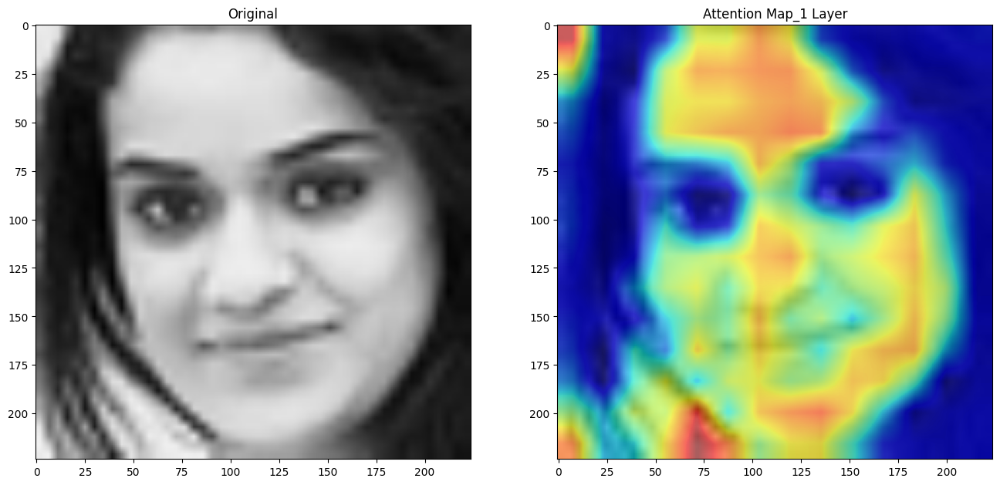

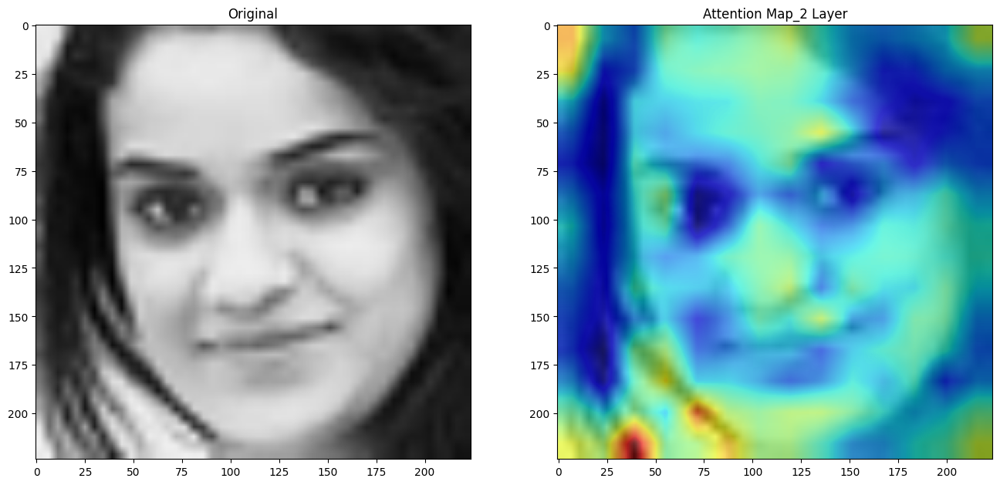

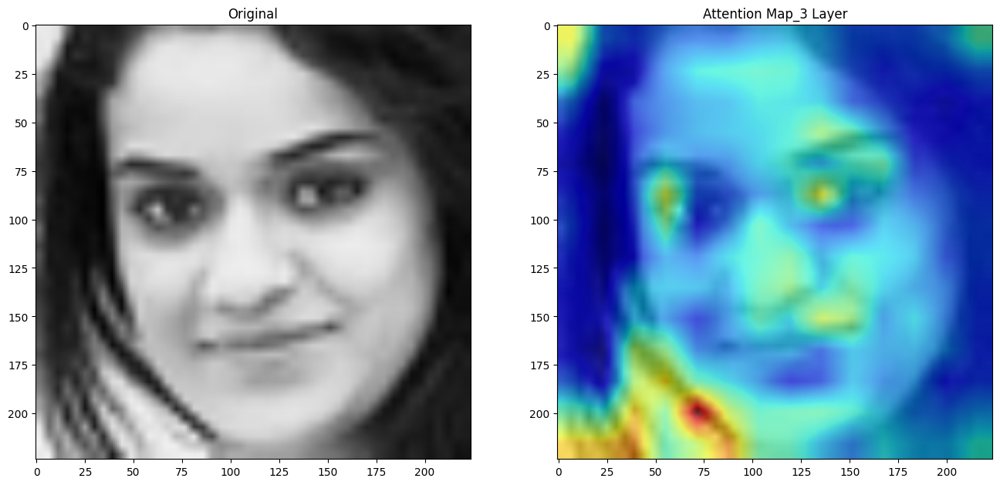

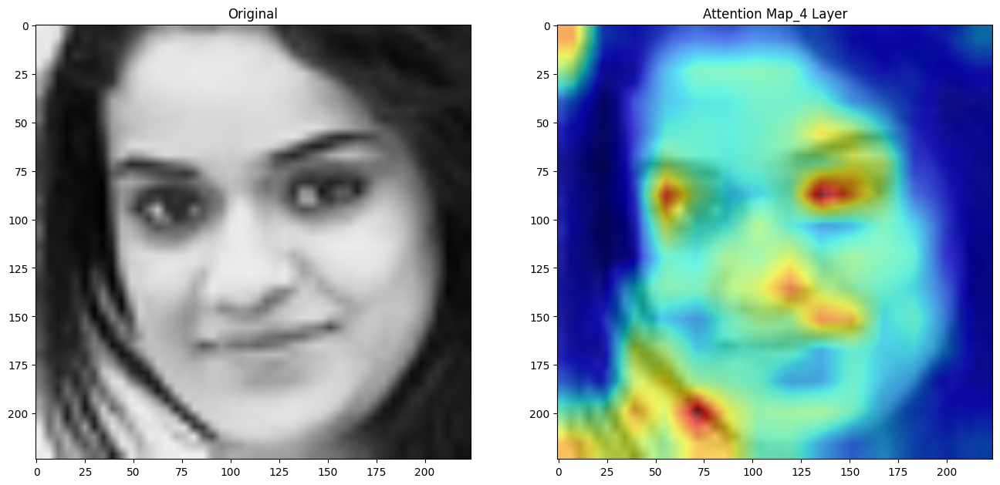

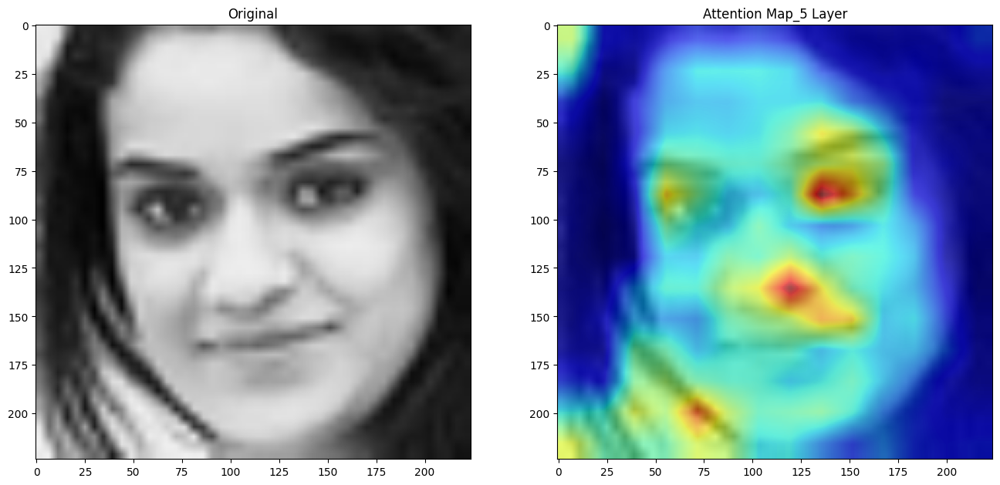

...

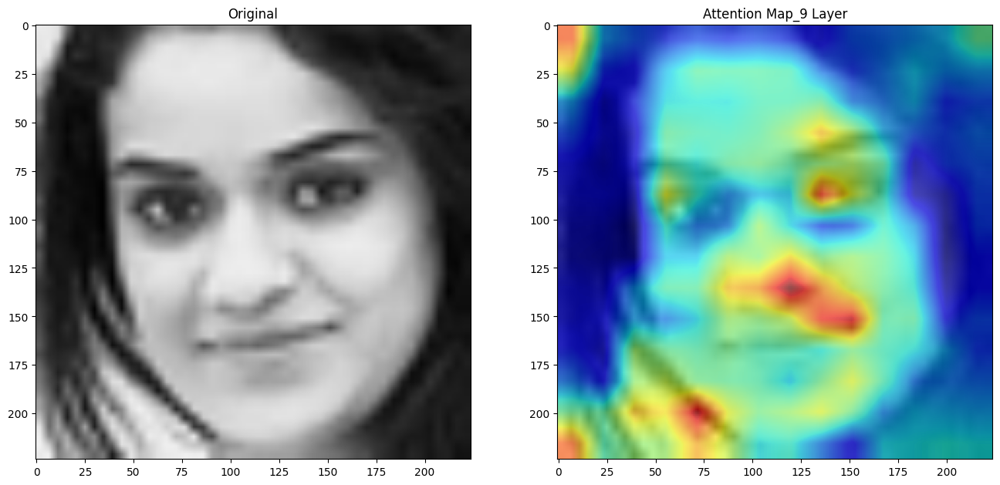

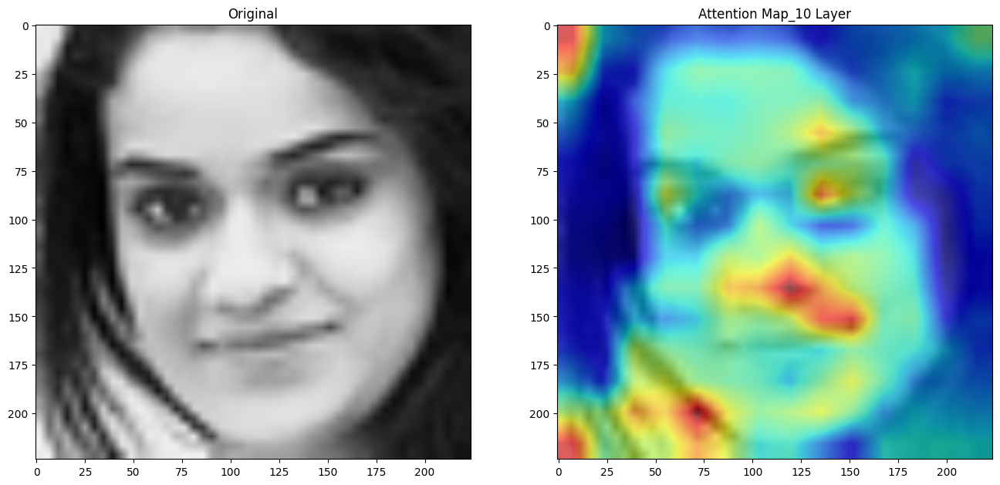

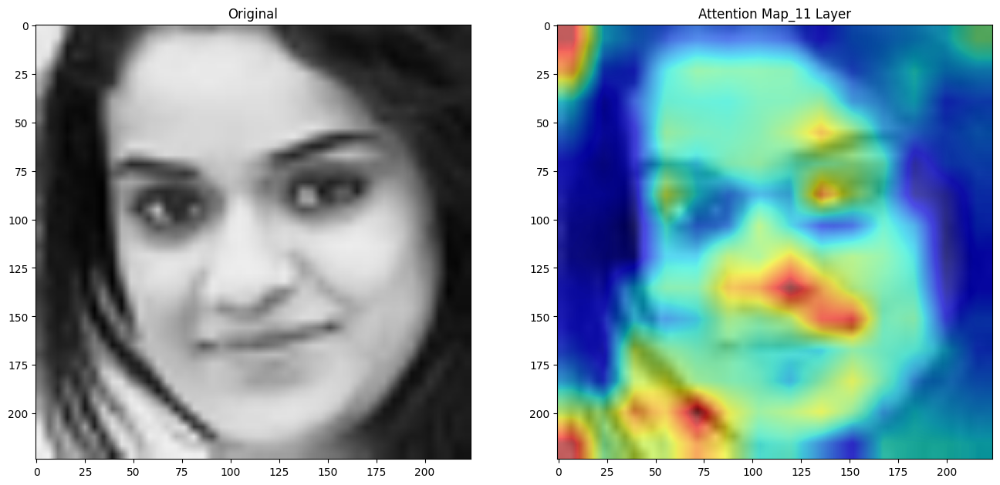

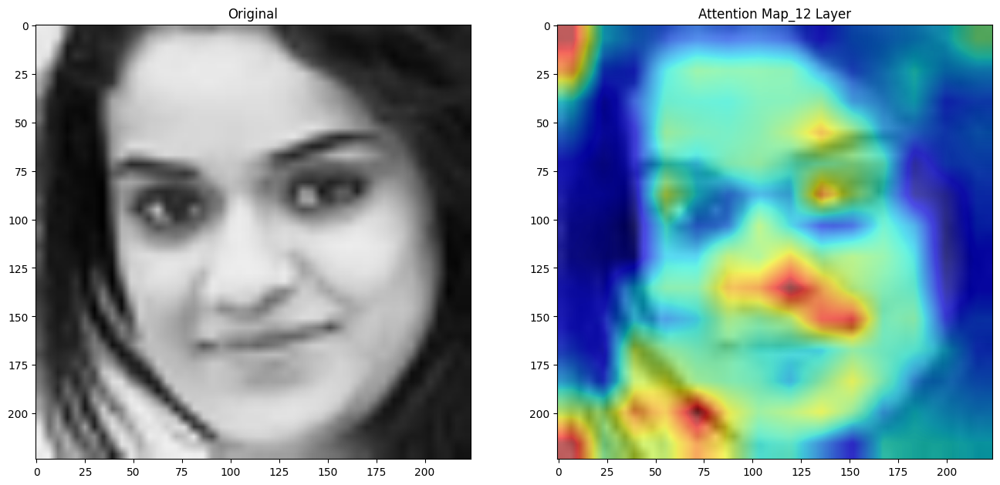

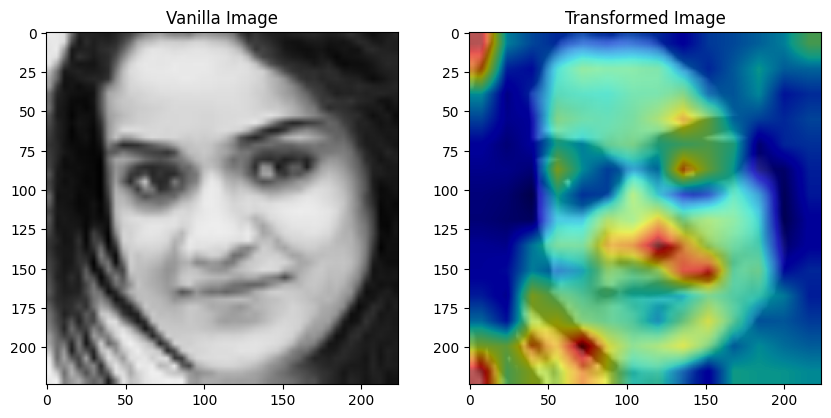

In [89]:
index = 4
rotation_value = 0
flip_value = False
transformation = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((args.resolution, args.resolution)),
    transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Lambda(lambda img: img.rotate(rotation_value)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
vanilla_transformation = transforms.Compose([transforms.ToPILImage(),
                                     transforms.Resize((224, 224)),
                                     transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
                                     transforms.Lambda(lambda img: img.rotate(rotation_value))
                                     ])
run_model_and_show_results(model, index, transformation, vanilla_transformation, True)

### Analyzing image, nose covered

#### MediaPipe stuff

In [15]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

model_path_local = 'C:\\BME\\7_felev\\szakdoli\\models\\mediapipe\\face_landmarker_v2_with_blendshapes.task'

base_options = python.BaseOptions(model_asset_path=model_path_local)
options = vision.FaceLandmarkerOptions(base_options=base_options,
                                        output_face_blendshapes=True,
                                        output_facial_transformation_matrixes=True,
                                        num_faces=1)
detector = vision.FaceLandmarker.create_from_options(options)

In [16]:
# normalizer code from mediapipe

from typing import List, Mapping, Optional, Tuple, Union
import math

def _normalized_to_pixel_coordinates(
    normalized_x: float, normalized_y: float, image_width: int,
    image_height: int) -> Union[None, Tuple[int, int]]:
  """Converts normalized value pair to pixel coordinates."""

  # Checks if the float value is between 0 and 1.
  def is_valid_normalized_value(value: float) -> bool:
    return (value > 0 or math.isclose(0, value)) and (value < 1 or
                                                      math.isclose(1, value))

  if not (is_valid_normalized_value(normalized_x) and
          is_valid_normalized_value(normalized_y)):
    # TODO: Draw coordinates even if it's outside of the image bounds.
    return None
  x_px = min(math.floor(normalized_x * image_width), image_width - 1)
  y_px = min(math.floor(normalized_y * image_height), image_height - 1)
  return x_px, y_px

In [17]:
def get_detection_result_for_image(image, detector):
    image = np.array(image, dtype=np.uint8)
    image = mp.Image(image_format = mp.ImageFormat.SRGB, data = image)
    detection_result = detector.detect(image)
    
    return detection_result

In [18]:
def cover_nose(face_image, detector):
    detection_result = get_detection_result_for_image(face_image, detector)
    face_landmarks = detection_result.face_landmarks[0]
    nose_top_left_3d = face_landmarks[128]
    nose_top_left_2d = _normalized_to_pixel_coordinates(nose_top_left_3d.x, nose_top_left_3d.y, 224, 224)
    nose_top_right_3d = face_landmarks[357]
    nose_top_right_2d = _normalized_to_pixel_coordinates(nose_top_right_3d.x, nose_top_right_3d.y, 224, 224)
    nose_bottom_left_3d = face_landmarks[203]
    nose_bottom_left_2d = _normalized_to_pixel_coordinates(nose_bottom_left_3d.x, nose_bottom_left_3d.y, 224, 224)
    nose_bottom_right_3d = face_landmarks[423]
    nose_bottom_right_2d = _normalized_to_pixel_coordinates(nose_bottom_right_3d.x, nose_bottom_right_3d.y, 224, 224)
    
    poly_points = np.array([
        [nose_top_left_2d[0], nose_top_left_2d[1]],
        [nose_top_right_2d[0], nose_top_right_2d[1]],
        [nose_bottom_right_2d[0], nose_bottom_right_2d[1]],
        [nose_bottom_left_2d[0], nose_bottom_left_2d[1]]
    ], dtype=np.int32)
    
    cv2.fillPoly(face_image, [poly_points], color=(0, 0, 0))
    
    return face_image

### Now plotting

In [19]:
def run_model_and_show_results_nose(model, dataset_index, transformation, vanilla_transformation, detector, vis = False):
    model.eval()
    model.to(device)
    
    face_image = test_images[dataset_index]
    label = test_labels[dataset_index]
    
    face_image = np.array(face_image, dtype=np.uint8)
    face_image = cv2.cvtColor(face_image, cv2.COLOR_GRAY2RGB)
    face_image = Image.fromarray(face_image)
    resize_transform = transforms.Resize((224, 224))
    face_image = resize_transform(face_image)
    face_image = np.array(face_image)
    
    nose_covered = cover_nose(face_image, detector)
    
    transformed_face, vanilla_face = transform_image(nose_covered, transformation, vanilla_transformation)
    
    transformed_face = transformed_face.to(device)
    output, att_mat = model(transformed_face.unsqueeze(0))
    mask = get_attention_mask(att_mat, (transformed_face.shape[1], transformed_face.shape[2]), vis, vanilla_face)
    
    transformed_face = transformed_face.to('cpu')
    pred_emotion, true_emotion = tensor_to_emotion(output, label)
    
    print(f"Prediction: {pred_emotion}")
    print(f"Ground Truth: {true_emotion}")
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 10))
    
    ax1.axis('off')
    ax2.axis('off')
    ax1.set_title("Input")
    ax2.set_title("Output")
    _ = ax1.imshow(vanilla_face)
    _ = ax2.imshow(transformed_face.permute(1, 2, 0))
    _ = ax2.imshow(mask, cmap='jet', alpha = 0.6)

In [20]:
transformation = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((args.resolution, args.resolution)),
    transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Lambda(lambda img: img.rotate(rotation_value)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
vanilla_transformation = transforms.Compose([transforms.ToPILImage(),
                                     transforms.Resize((224, 224)),
                                     transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
                                     transforms.Lambda(lambda img: img.rotate(rotation_value))
                                     ])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Prediction: Happy
Ground Truth: Happy


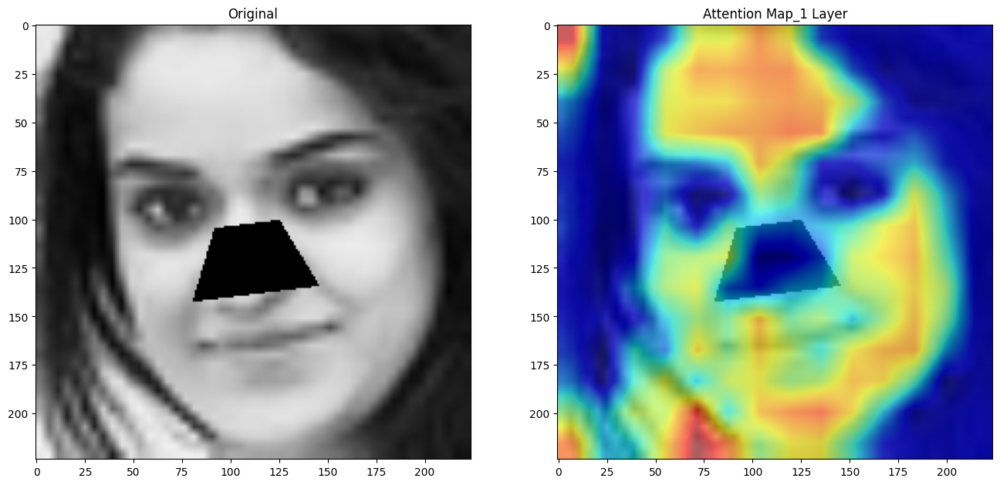

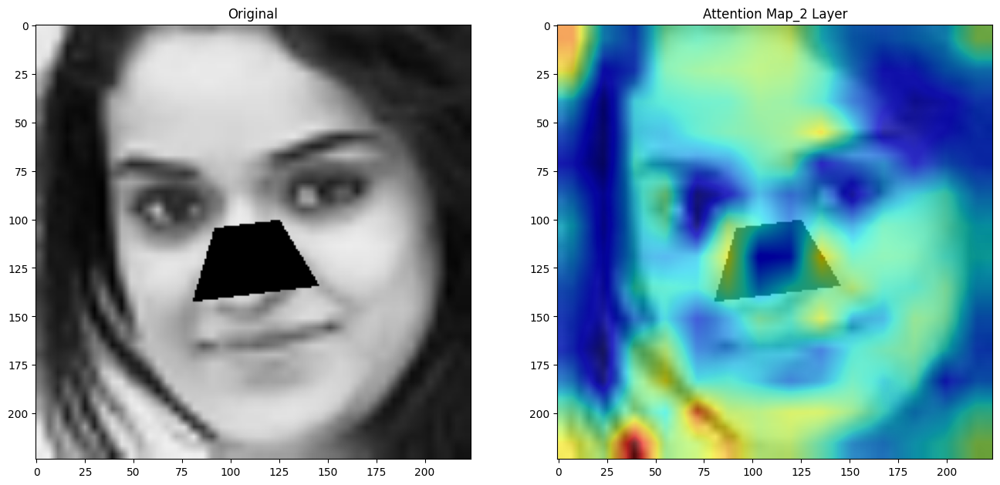

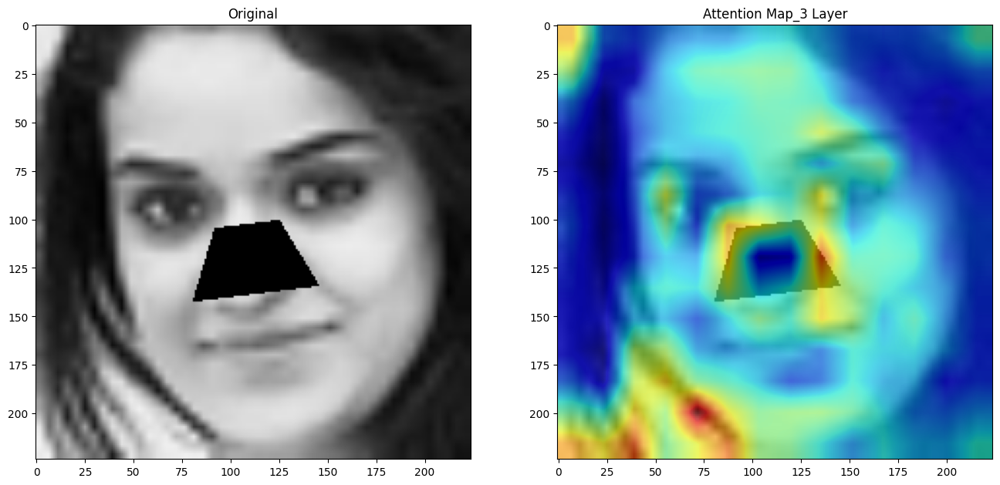

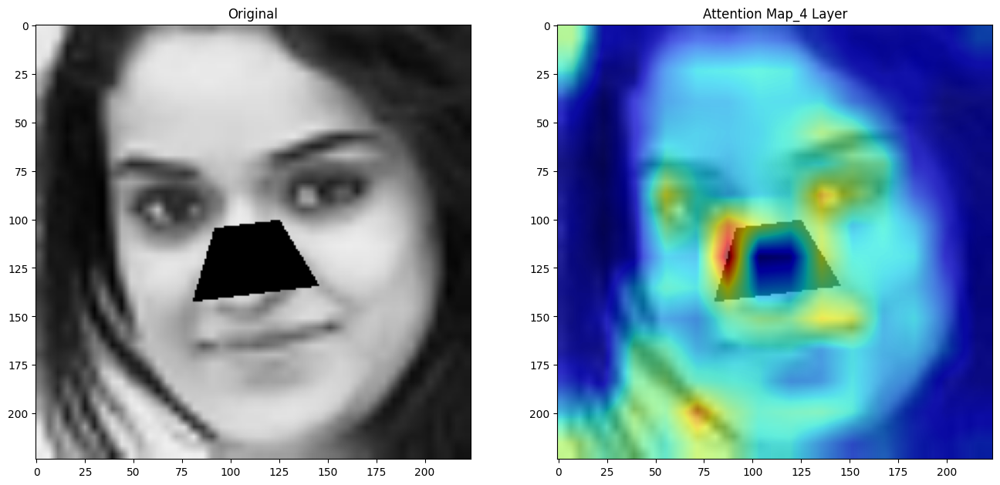

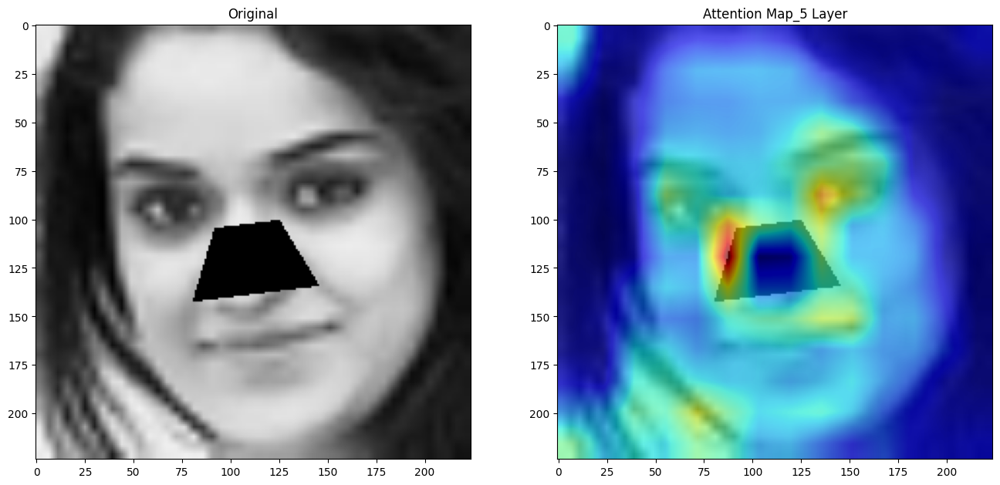

...

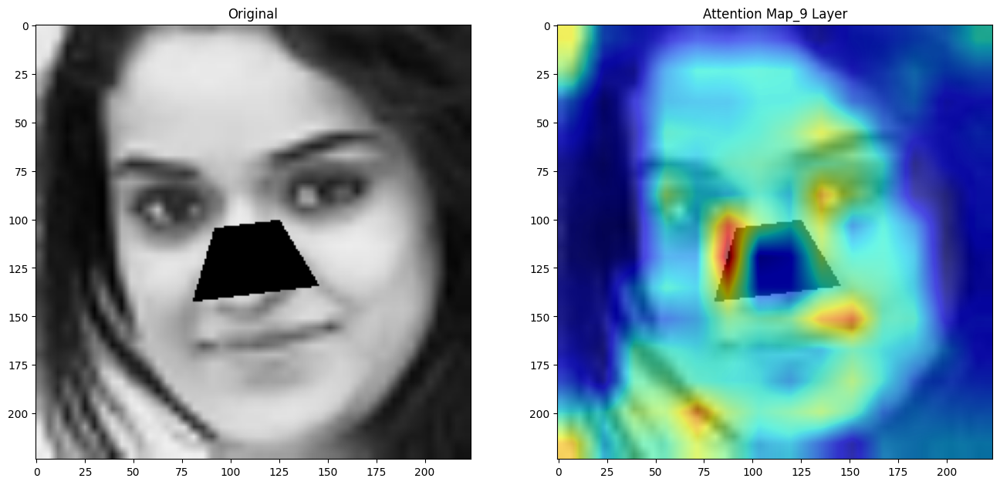

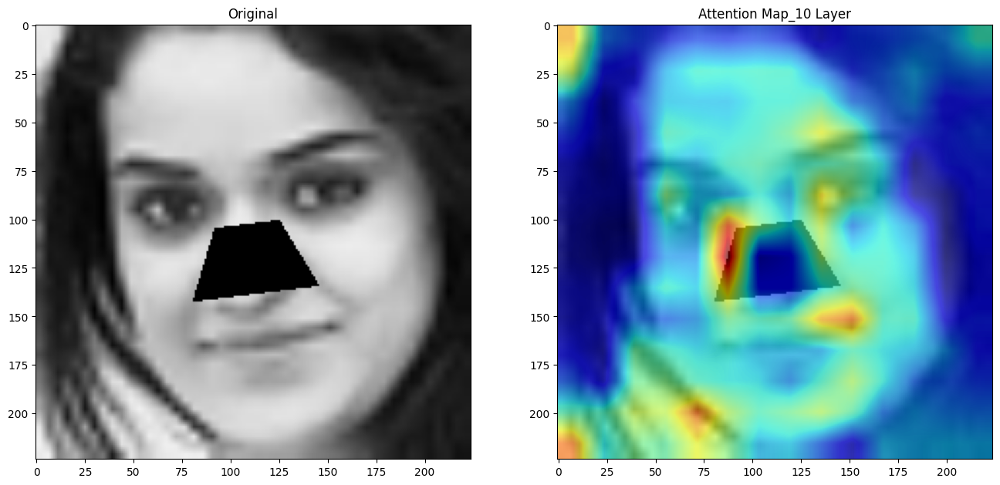

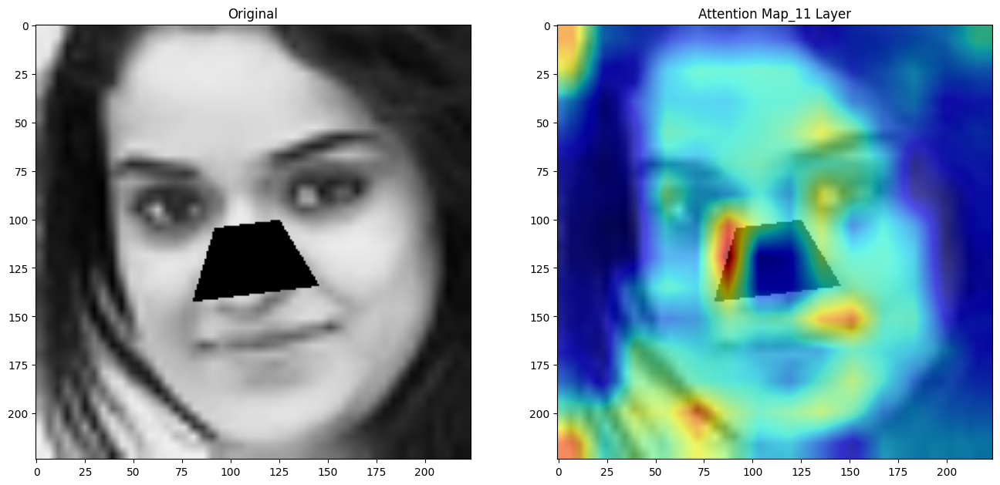

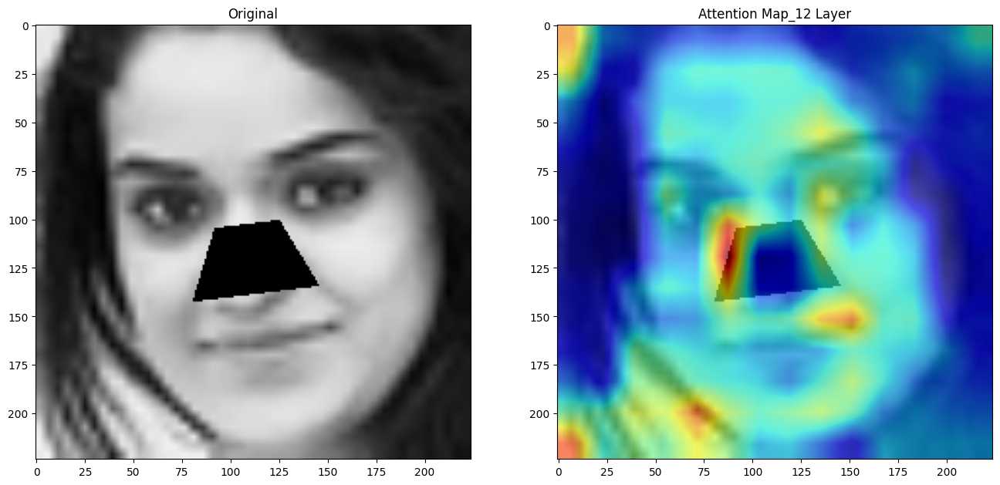

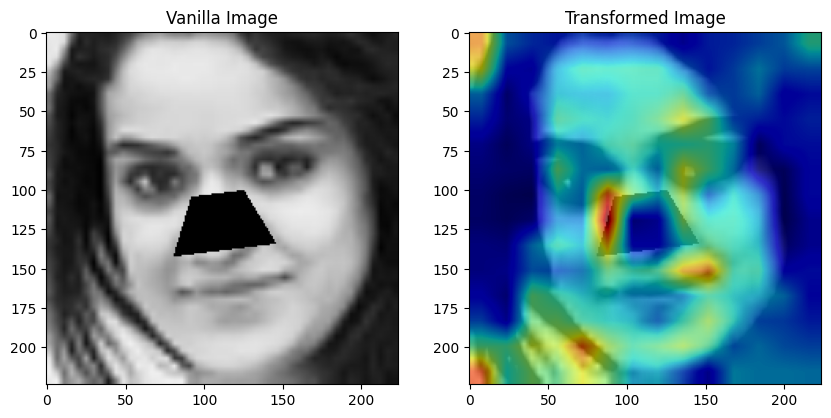

In [93]:
index = 4
rotation_value = 0
flip_value = False

run_model_and_show_results_nose(model, index, transformation, vanilla_transformation, detector, True)

### The two at the same time

In [21]:
transformation = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((args.resolution, args.resolution)),
    transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Lambda(lambda img: img.rotate(rotation_value)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
vanilla_transformation = transforms.Compose([transforms.ToPILImage(),
                                     transforms.Resize((224, 224)),
                                     transforms.Lambda(lambda img: img.transpose(Image.FLIP_LEFT_RIGHT) if flip_value else img),
                                     transforms.Lambda(lambda img: img.rotate(rotation_value))
                                     ])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Prediction: Angry
Ground Truth: Angry
------
Prediction: Angry
Ground Truth: Angry


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


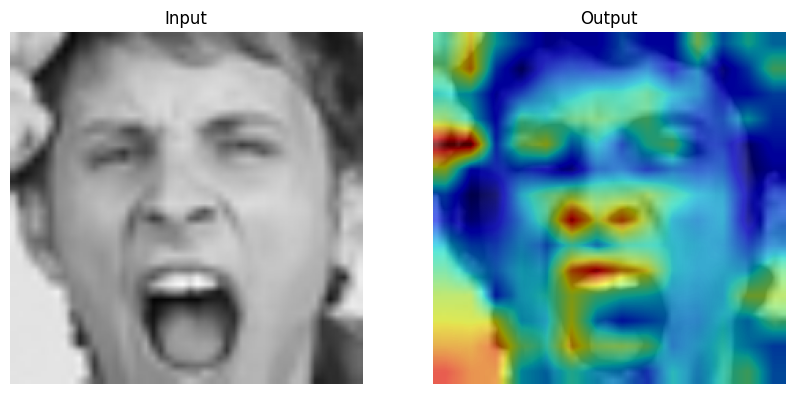

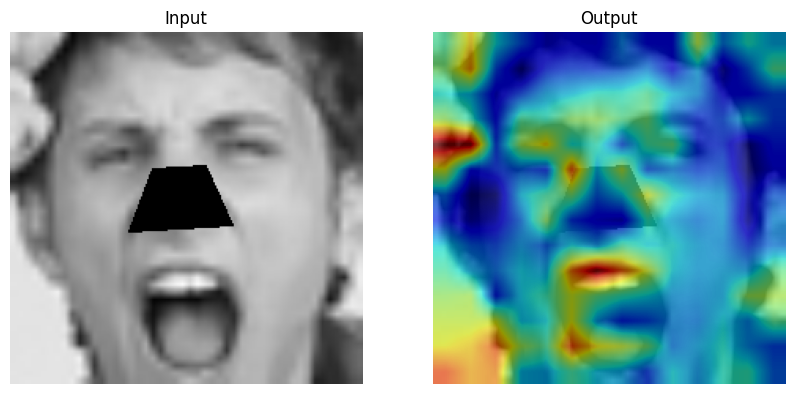

In [33]:
# 8, 41, 62
index = 8
rotation_value = 0
flip_value = True

run_model_and_show_results(model, index, transformation, vanilla_transformation)
print("------")
run_model_and_show_results_nose(model, index, transformation, vanilla_transformation, detector)